In [1]:
import sys ,os
p = os.path.abspath('../..')
if p not in sys.path:
    sys.path.append(p)

import configparser
import pandas as pd
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from importlib import reload
import cv2

import utils as Utils
reload(Utils)
config = configparser.ConfigParser()
config.read("../../config.ini")

['../../config.ini']

In [2]:
PROCESSED_DATA_PATH = config["PATHS"]["PROCESSED_DATA_PATH"]
IMAGES_PATH = os.path.join(PROCESSED_DATA_PATH,"segmentation", "rgb_images")
METADATA_PATH = os.path.join(PROCESSED_DATA_PATH, "object_detection","metadata_with_bboxes.pkl") # Read from dataset after object detection
#METADATA_PATH = os.path.join(PROCESSED_DATA_PATH, "segmentation","metadata.csv") # Read from segmentation generated dataset

print(PROCESSED_DATA_PATH)
print(IMAGES_PATH)
print(METADATA_PATH)

/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19_CT/processed
/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19_CT/processed/segmentation/rgb_images
/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19_CT/processed/object_detection/metadata_with_bboxes.pkl


In [3]:
processed_metadata_df = pd.read_pickle(METADATA_PATH)

In [7]:
processed_metadata_df[["dataset"]].value_counts()

dataset        
MOSMED             46411
CNCB               21470
MIDRC_RICORD_1A    15887
COVID_CT_JunMa      3102
COVID_SEG_2          829
COVID_SEG_1          100
Name: count, dtype: int64

In [7]:
processed_metadata_df[["has_infection"]].value_counts()

has_infection
False            75886
True             11913
Name: count, dtype: int64

### Mosmed

In [18]:
processed_mosmed_df = processed_metadata_df[processed_metadata_df["dataset"]=="MOSMED"]
print(processed_mosmed_df.shape)
processed_mosmed_df.head(10)


(46411, 11)


,dataset,label,scan_index,slice_index,ct_slice_path,infection_mask_path,lung_mask_path,height,width,has_infection,has_lung_mask
19918,MOSMED,covid,0,0,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19919,MOSMED,covid,0,1,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19920,MOSMED,covid,0,2,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19921,MOSMED,covid,0,3,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19922,MOSMED,covid,0,4,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19923,MOSMED,covid,0,5,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19924,MOSMED,covid,0,6,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19925,MOSMED,covid,0,7,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19926,MOSMED,covid,0,8,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19927,MOSMED,covid,0,9,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False


In [19]:
# Unique scan_index
print("Unique scans: {}".format(processed_mosmed_df["scan_index"].nunique()))
print("Scans without infection: {}".format(processed_mosmed_df[processed_mosmed_df["has_infection"]==False]["scan_index"].nunique()))
print("Scans with infection: {}".format(processed_mosmed_df[processed_mosmed_df["has_infection"]==True]["scan_index"].nunique()))

Unique scans: 1110
Scans without infection: 1110
Scans with infection: 50


In [8]:
processed_metadata_df[processed_metadata_df["dataset"]=="MOSMED"].head(10)

,dataset,label,scan_index,slice_index,ct_slice_path,infection_mask_path,lung_mask_path,height,width,has_infection,has_lung_mask
19918,MOSMED,covid,0,0,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19919,MOSMED,covid,0,1,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19920,MOSMED,covid,0,2,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19921,MOSMED,covid,0,3,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19922,MOSMED,covid,0,4,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19923,MOSMED,covid,0,5,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19924,MOSMED,covid,0,6,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19925,MOSMED,covid,0,7,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19926,MOSMED,covid,0,8,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False
19927,MOSMED,covid,0,9,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,<NA>,512,512,False,False


In [6]:
print(processed_metadata_df[processed_metadata_df["dataset"]=="COVID_CT_JunMa"].shape)
print(processed_metadata_df[processed_metadata_df["dataset"]=="COVID_CT_JunMa"]["has_infection"].value_counts())
print(set(processed_metadata_df[processed_metadata_df["dataset"]=="COVID_CT_JunMa"]["scan_index"].values))
processed_metadata_df[processed_metadata_df["dataset"]=="COVID_CT_JunMa"]

(3102, 11)
has_infection
True     1696
False    1406
Name: count, dtype: int64
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18}


,dataset,label,scan_index,slice_index,ct_slice_path,infection_mask_path,lung_mask_path,height,width,has_infection,has_lung_mask
929,COVID_CT_JunMa,covid,0,0,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
930,COVID_CT_JunMa,covid,0,1,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
931,COVID_CT_JunMa,covid,0,2,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
932,COVID_CT_JunMa,covid,0,3,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
933,COVID_CT_JunMa,covid,0,4,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,True
...,...,...,...,...,...,...,...,...,...,...,...
4026,COVID_CT_JunMa,covid,18,88,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
4027,COVID_CT_JunMa,covid,18,89,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
4028,COVID_CT_JunMa,covid,18,90,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False
4029,COVID_CT_JunMa,covid,18,91,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,/media/my_ftp/BasesDeDatos_Torax_RX_CT/COVID19...,512,512,False,False


In [7]:
print(processed_metadata_df[processed_metadata_df["dataset"]=="CNCB"]["has_infection"].value_counts())
print(processed_metadata_df[processed_metadata_df["dataset"]=="CNCB" & processed_metadata_df["has_infection"]==True]["scan_index"].nunique())

has_infection
False    20921
True       549
Name: count, dtype: int64


TypeError: Cannot perform 'rand_' with a dtyped [bool] array and scalar of type [bool]

In [10]:
# get min and max height and width per "dataset" column value
processed_metadata_df.groupby("dataset")[["height", "width"]].agg(["min", "max"])

height      width     
                   min  max   min  max
dataset                               
CNCB               512  512   512  512
COVID_CT_JunMa     512  512   512  512
COVID_SEG_1        512  512   512  512
COVID_SEG_2        512  512   512  512
MIDRC_RICORD_1A    512  512   512  512
MOSMED             512  512   512  512

# Visualize CTs

In [11]:
processed_metadata_df["ct_enhanced_path"] = processed_metadata_df["ct_slice_path"].apply(lambda x: x.replace("rgb_images", "enhanced"))

### Non-Equalized

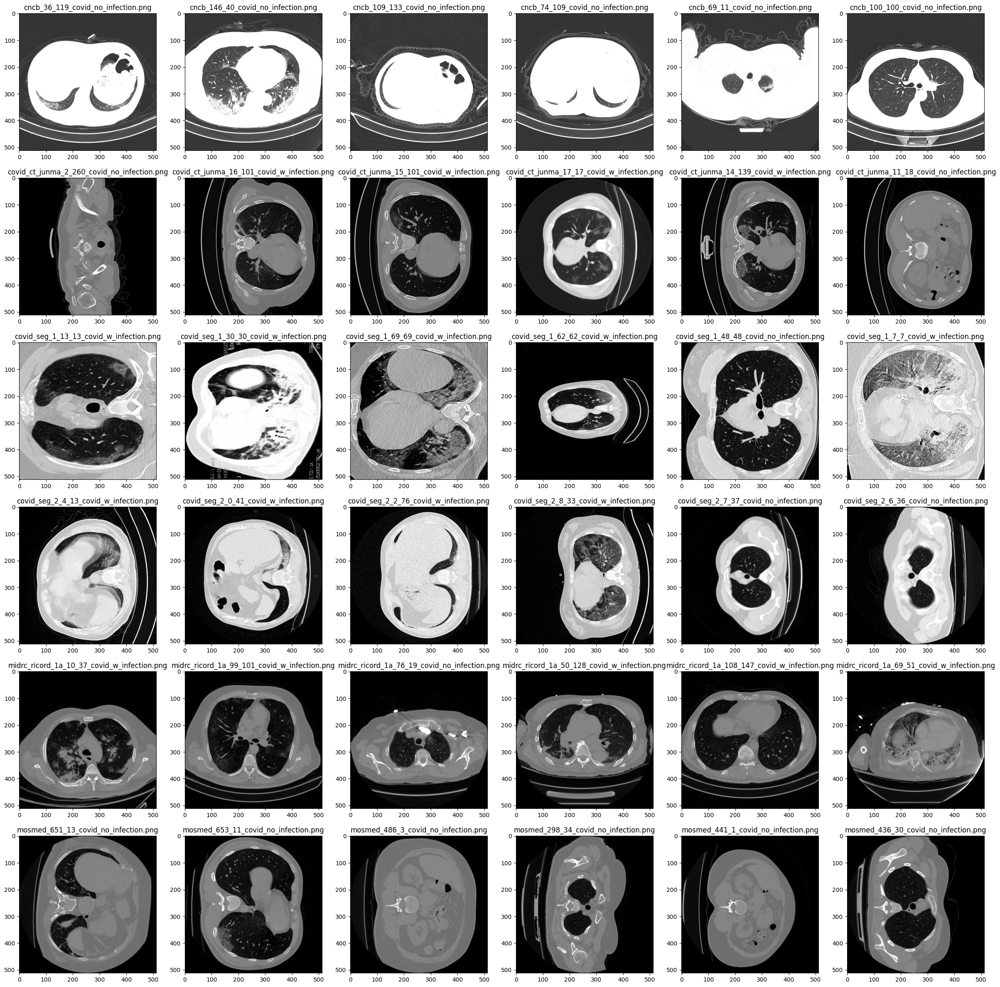

In [15]:
fig = plt.figure(figsize=(30, 30))
columns = 6
rows = 6
N_SAMPLES = columns*rows
n_samples_per_dataset = N_SAMPLES//6
sampled_processed_metadata_df = processed_metadata_df.groupby("dataset").apply(lambda x: x.sample(n=n_samples_per_dataset, random_state=1)).reset_index(drop=True)
for i in range(1, columns * rows+1):
    row = sampled_processed_metadata_df.iloc[i-1]
    img = cv2.imread(row["ct_slice_path"])
    file_name = row["ct_slice_path"].split("/")[-1]
    fig.add_subplot(rows, columns, i)
    #add title
    plt.title(file_name)
    plt.imshow(img, cmap="gray")


### Equalized

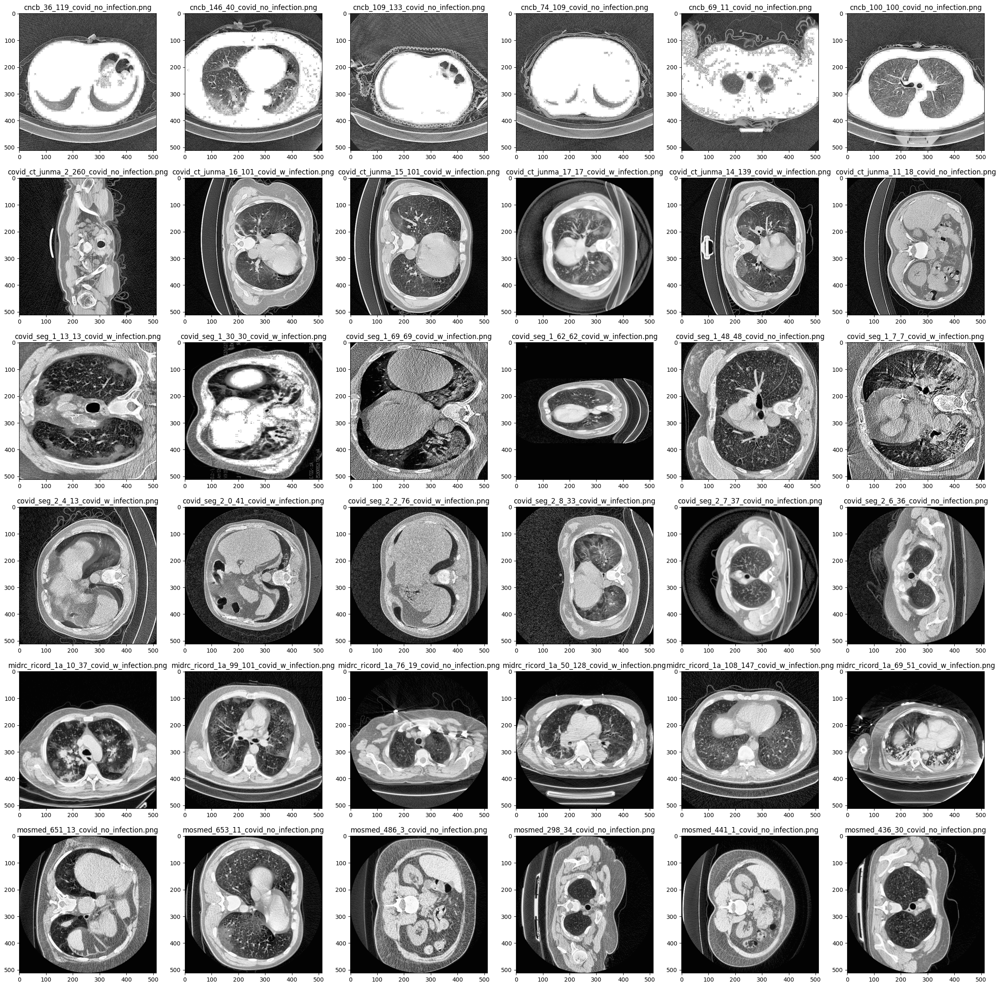

In [16]:
fig = plt.figure(figsize=(30, 30))
columns = 6
rows = 6
N_SAMPLES = columns*rows
n_samples_per_dataset = N_SAMPLES//6
sampled_processed_metadata_df = processed_metadata_df.groupby("dataset").apply(lambda x: x.sample(n=n_samples_per_dataset, random_state=1)).reset_index(drop=True)
for i in range(1, columns * rows+1):
    row = sampled_processed_metadata_df.iloc[i-1]
    img = cv2.imread(row["ct_enhanced_path"])
    file_name = row["ct_enhanced_path"].split("/")[-1]
    fig.add_subplot(rows, columns, i)
    #add title
    plt.title(file_name)
    plt.imshow(img, cmap="gray")


# Visualize CT and Lung mask

In [1]:
fig = plt.figure(figsize=(20, 20))
columns = 4
rows = 5
for i in range(1, columns * rows + 1):
    row = processed_metadata_df[processed_metadata_df["ct_slice_path"]==''].iloc[0]
    img = cv2.imread(row["ct_slice_path"])
    lung_mask = cv2.imread(row["lung_mask_path"], cv2.IMREAD_UNCHANGED)
    infection_mask = cv2.imread(row["infection_mask_path"],cv2.IMREAD_UNCHANGED)
    file_name = row["ct_slice_path"].split("/")[-1]
    fig.add_subplot(rows, columns, i)
    #add title
    plt.title(file_name)
    plt.imshow(img, cmap="gray")
    plt.imshow(infection_mask, alpha=0.5, cmap="jet")


NameError: name 'plt' is not defined

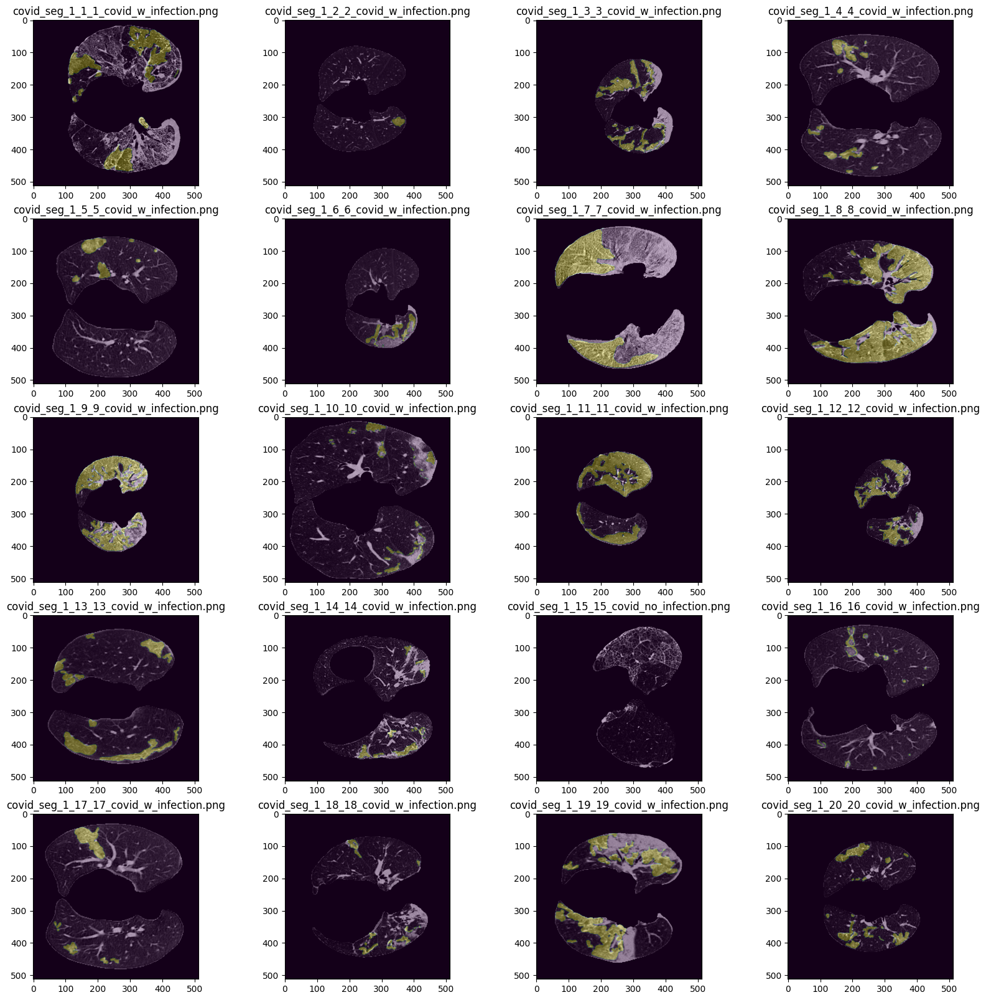

In [43]:
fig = plt.figure(figsize=(20, 20))
columns = 4
rows = 5
for i in range(1, columns * rows + 1):
    row = processed_metadata_df[processed_metadata_df["dataset"]=='COVID_SEG_1'].iloc[i]
    img = cv2.imread(row["ct_slice_path"])
    lung_mask = cv2.imread(row["lung_mask_path"], cv2.IMREAD_UNCHANGED)
    infection_mask = cv2.imread(row["infection_mask_path"],cv2.IMREAD_UNCHANGED)
    masked_img = cv2.bitwise_and(img, img, mask= lung_mask)
    file_name = row["ct_slice_path"].split("/")[-1]
    fig.add_subplot(rows, columns, i)
    #add title
    plt.title(file_name)
    plt.imshow(masked_img, cmap="gray")
    plt.imshow(infection_mask, alpha=0.3, cmap="viridis")

# Visualize some specific dataset CTs

/tmp/ipykernel_902724/2583472386.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  row = processed_metadata_df[processed_metadata_df["dataset"]=='CNCB'][processed_metadata_df["has_infection"]=="True"].iloc[i]
/tmp/ipykernel_902724/2583472386.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  row = processed_metadata_df[processed_metadata_df["dataset"]=='CNCB'][processed_metadata_df["has_infection"]=="True"].iloc[i]
/tmp/ipykernel_902724/2583472386.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  row = processed_metadata_df[processed_metadata_df["dataset"]=='CNCB'][processed_metadata_df["has_infection"]=="True"].iloc[i]
/tmp/ipykernel_902724/2583472386.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  row = processed_metadata_df[processed_metadata_df["dataset"]=='CNCB'][processed_metadata_df["has_infection"]=="True"].iloc[i]
/tmp/ipykernel_902724/258347

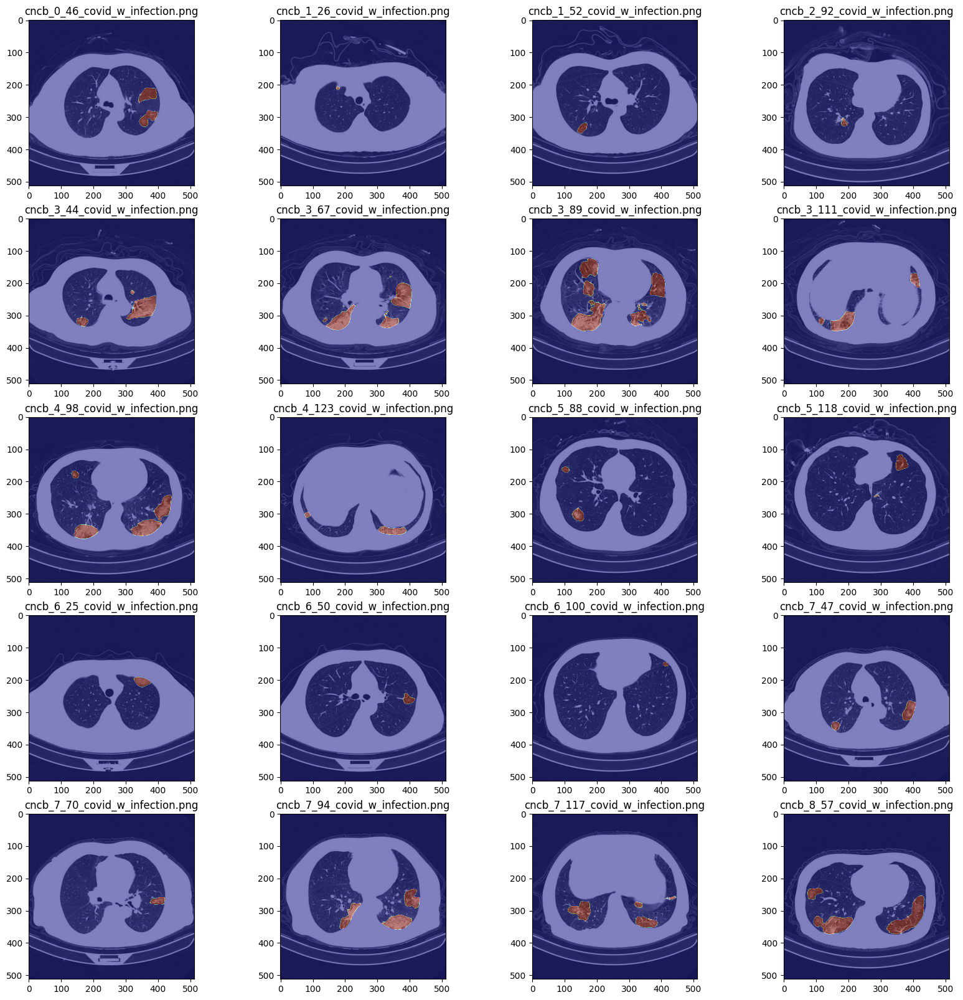

In [6]:
fig = plt.figure(figsize=(20, 20))
columns = 4
rows = 5
for i in range(1, columns * rows + 1):
    row = processed_metadata_df[processed_metadata_df["dataset"]=='CNCB'][processed_metadata_df["has_infection"]=="True"].iloc[i]
    img = cv2.imread(row["ct_slice_path"])
    infection_mask = cv2.imread(row["infection_mask_path"],cv2.IMREAD_UNCHANGED)
    file_name = row["ct_slice_path"].split("/")[-1]
    fig.add_subplot(rows, columns, i)
    #add title
    plt.title(file_name)
    plt.imshow(img, cmap="gray")
    plt.imshow(infection_mask, alpha=0.5, cmap="jet")

# Enhanced CTs

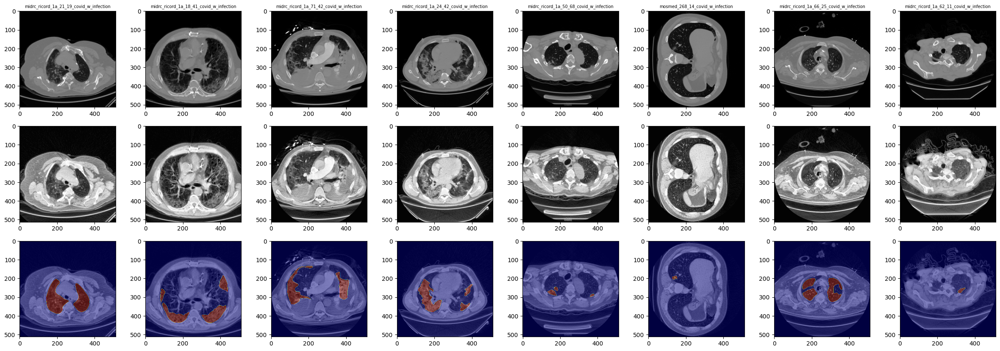

In [18]:
fig = plt.figure(figsize=(30, 10))
samples = 8
rows = 3
columns = samples
meta_with_infection_df = processed_metadata_df[processed_metadata_df["has_infection"]==True].sample(samples).copy()
for i in range(1, samples + 1):
    row = meta_with_infection_df.iloc[i-1]
    img = cv2.imread(row["ct_slice_path"])
    enhanced_img = cv2.imread(row["ct_slice_path"].replace("rgb_images", "enhanced"))
    infection_mask = cv2.imread(row["infection_mask_path"],cv2.IMREAD_UNCHANGED)
    file_name = row["ct_slice_path"].split("/")[-1]

    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap="gray")
    plt.title(file_name.split(".")[0], fontsize=7)
    fig.add_subplot(rows, columns, columns + i)

    plt.imshow(enhanced_img, cmap="gray")
    fig.add_subplot(rows, columns, 2*columns + i)
    plt.imshow(enhanced_img)
    plt.imshow(infection_mask, alpha=0.5, cmap="jet")

plt.show()


# Visualize a full volume